# Librerías

In [3]:
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
import os
import pandas as pd
import numpy as np

# Funcionalidades asociadas al modelo.

Se mostrarán las capacidades del modelo para clasificar cada una de los tipos de daños, y, a través de ello, realizar cálculos que permitan diagnósticar el estado de salud de una vía. Las implementaicones siguientes son elaboraciones propias apoyados de librerías open sources de python.

## Funcionamiento general.

Basado en el prototipo del primer informe [4], se desea contar con un modelo que sea capaz de obtener los siguientes resultados:

* Obtener la imagen con las clasificaciones y ubicaciones realizadas.
* Obtener la lista de daños y lista de bounding boxes correspondientes.
* Calcular la salud de un tramo de una vía a través de la imagen.
* Realizar un conteo de los tipos de daños encontrados en la imagen.
* Mostrar la proporción de tipos de daños obtenidos en la imagen,

Para las siguientes funcionalidades, se decidió no mostrar el valor de confianza, ya que puede sobre cargar de información la imagen, porque en muchos casos, un solo tramo puede tener más de 3 daños, por lo que dificulta la lectura. Sin embargo, los valores de confianza oscilan desde 0.4 hasta 0.99 en las pruebas siguientes. 

In [4]:
# Cargar el modelo desde el archivo 'best.pt'
modelv8st = YOLO('weights/best.pt')

c:\Users\denil\AppData\Local\Programs\Python\Python310\lib\site-packages\ultralytics\nn\tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, m

In [107]:
# Constantes

"""
    best_bboxes_p8 = best_bboxes[best_bboxes['confidence'] >= 0.8] 


    # Ajustar umbrales para seleccionar mejores bounding boxes
    if len(best_bboxes_p8) < 3:
        best_bboxes_p7 = best_bboxes[best_bboxes['confidence'] >= 0.7]
    elif len(best_bboxes_p7) < 1:
        best_bboxes_p6 = best_bboxes[best_bboxes['confidence'] >= 0.6]
    elif len(best_bboxes_p6) == 0:
        best_bboxes = best_bboxes[best_bboxes['confidence'] >= 0.3]

"""

LABEL_MAPEADO_YOLOV8S={
    'D10':0,
    'D00':1,
    'D20':2,
    'Repair':3,
    'D40':4,
    'Block crack':5,
    'D44':6,
    'D01':7,
    'D11':8,
    'D43':9,
    'D50':10,
    'D0w0':11
}

id2Labelv8s={v:k for k,v in LABEL_MAPEADO_YOLOV8S.items()}


list_colors_aux=[
    'darkblue', 'orange',
    'darkgreen', 'gold',
    'coral',
    'darkred', 'maroon',
    'black', 'purple',
    'indigo', 'saddlebrown',
    'darkslategray', 'lightcyan',
    'black', 'yellow',
    'charcoal', 'lightgoldenrodyellow',
    'saddlebrown', 'lightsteelblue'
]

COLORS_V8S={id2Labelv8s[i]:list_colors_aux[i] for i in range(0,len(id2Labelv8s))}

# Constantes de los tipos de danos en carreteras
DAMAGES_ROADS=[{'Class': "D00", 'Detail': "wheel mark part", 'DamageType': "logitudinal linear crack"},
               {'Class': "D01", 'Detail': "construction joint part", 'DamageType': "logitudinal linear crack"},
               {'Class': "D10", 'Detail': "equal interval", 'DamageType': "lateral linear crack"},
               {'Class': "D11", 'Detail': "construction joint part", 'DamageType': "lateral linear crack"},
               {'Class': "D20", 'Detail': "partial pavement", 'DamageType': "alligator crack"},
               {'Class': "D20", 'Detail': "overall pavement", 'DamageType': "alligator crack"},
               {'Class': "D40", 'Detail': "rutting", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D40", 'Detail': "bump", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D40", 'Detail': "pothole", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D40", 'Detail': "separation", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D43", 'Detail': "crosswalk blur", 'DamageType': "other corruption"},
               {'Class': "D44", 'Detail': "white line blur", 'DamageType': "other corruption"},
               {'Class': "Repair", 'Detail': "white line blur", 'DamageType': "scar"},
               {'Class': "Block crack", 'Detail': "white line blur", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D50", 'Detail': "white line blur", 'DamageType': "Manhole cover"},
               {'Class': "D0w0", 'Detail': "white line blur", 'DamageType': "logitudinal linear crack"}
               ]

df_DAMAGE_ROADS=pd.DataFrame(columns=["Class","Detail","DamageType"])

for i in range(0,len(DAMAGES_ROADS)):
    json_vals=DAMAGES_ROADS[i]
    df_DAMAGE_ROADS.loc[i]=(json_vals["Class"],json_vals["Detail"],json_vals["DamageType"])

Cada tipo de daño tendrá su color respectivo, esto se puede observar en el diccionario siguiente.

In [100]:
COLORS_V8S

{'D10': 'darkblue',
 'D00': 'orange',
 'D20': 'darkgreen',
 'Repair': 'gold',
 'D40': 'coral',
 'Block crack': 'darkred',
 'D44': 'maroon',
 'D01': 'black',
 'D11': 'purple',
 'D43': 'indigo',
 'D50': 'saddlebrown',
 'D0w0': 'darkslategray'}

### Función `get_external_img_v8(model, image)`.

Entrada:
- Model: Modelo YOLO, cargado con sus pesos.

- image: Ruta de la imagen.

Salida:
- image: Imagen con los bounding box segmetados por color.

- L_bboxes: Lista de bounding box de la forma (x1,y1,x2,y2).
    
- L_danios: Lista de daños clasificados por el modelo.

#### Función `get_pred_with_output_v8(model, dataset, index, use_dataset=True, L=[])`

Esta función es llamada en `get_external_img_v8(model, image)`, dicha función puede recibir dos tipos de conjuntos de datos: El primero es recibir un dataset precargador por la clase `DataLoader` y el segundo es la imagen cargada por la librería `PIL`. En este caso, como se usarán imágenes externas, el parámetro `use_dataset` se configura `False` y dentro de la lista `L` estará la imagen cargada. La función regresa como salida, lo mismo que `get_external_img_v8()`. Se decidió realizar la implementación de esta forma porque permite flexibilidad a la hora de usar distintos tipos de datos precargados.


In [7]:
def get_pred_with_output_v8(model, dataset, index, use_dataset=True, L=[]):
    # Cargar la imagen

    if use_dataset:
        # Si usa un dataset cargado por DataLoader
        image_ids = dataset.coco.getImgIds()
        image_id = image_ids[index]
        image_info = dataset.coco.loadImgs(image_id)[0]
        print(image_info['file_name'])

        image = Image.open(os.path.join("RDDD2022/Img/", image_info['file_name']))
    else:
        # Si usa una imagen de forma externa
        image = L[0]

    # Crear dataframe auxiliar para guardar los valores de las predicciones
    best_bboxes = pd.DataFrame(columns=['xmin', 'ymin', 'xmax', 'ymax','confidence','name'])

    # Realizar predicción utilizando el modelo YOLOv8
    results = model(image)
    for result in results:
        # Por cada resultado del conjunto de resultados

        # Obtener todos los bounding boxes
        boxes = result.boxes
        for box in boxes:
            # Por cada bounding box

            # Obtener coordenadas y la clase, moviéndolas a la CPU y convirtiéndolas a numpy
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()  # Coordenadas del bounding box
            class_id = int(box.cls[0].cpu().numpy())  # ID de la clase predicha
            score = float(box.conf[0].cpu().numpy())  # Confianza de la predicción

            # Guardar en el dataframe
            best_bboxes.loc[len(best_bboxes)]=(x1,y1,x2,y2,score,id2Labelv8s[class_id])
            #print(box.conf)
   
    # Definir el tamaño del texto
    font_size = 18
    
    try:
        # Cargar una fuente TrueType del sistema con el tamaño deseado
        font = ImageFont.truetype("arial.ttf", font_size)
    except IOError:
        # Si no se encuentra la fuente TrueType, usar la fuente por defecto
        font = ImageFont.load_default()
        
    # Convertir resultados a listas de coordenadas y etiquetas
    L_bboxes = best_bboxes[['xmin', 'ymin', 'xmax', 'ymax']].values.tolist()
    L_danios = [
        f"{row['name']}"
        #: {row['confidence']:.2f}" 
        for _, row in best_bboxes.iterrows()
    ]

    # Mov Y
    movy=20
    
    # Dibujar los resultados sobre la imagen
    draw = ImageDraw.Draw(image)
    for bbox, label in zip(L_bboxes, L_danios):
        xmin, ymin, xmax, ymax = bbox

        # Dibujar rectángulo
        draw.rectangle([(xmin, ymin), (xmax, ymax)], outline=COLORS_V8S[label.split(": ")[0]], width=4)

        # Calcular el tamaño del fondo del texto
        text_bbox = draw.textbbox((xmin, ymin-movy), label, font=font)
        # Dibujar el fondo blanco del texto
        draw.rectangle(text_bbox, fill="white")

        draw.text((xmin, ymin-movy), label, fill=COLORS_V8S[label.split(": ")[0]], font=font)
        #draw.text((xmin, ymin), label, fill="black", textsize=50)

    return image, L_bboxes, L_danios



0: 384x640 1 D10, 2 D00s, 2 D20s, 1 D40, 1 D50, 119.0ms
Speed: 13.0ms preprocess, 119.0ms inference, 281.0ms postprocess per image at shape (1, 3, 384, 640)


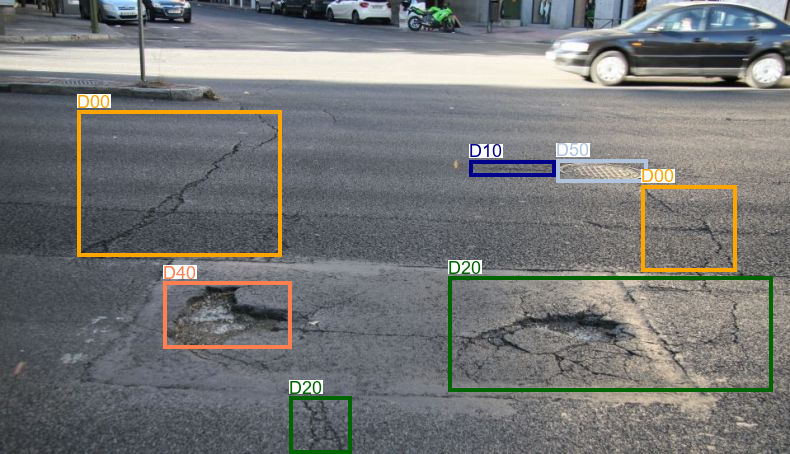

In [8]:
def get_external_img_v8(model, image_path):
    # Cargar la imagen
    image = Image.open(image_path)

    # Realizar predicción utilizando el modelo YOLOv8
    image, L_bboxes, L_danios = get_pred_with_output_v8(model,
                                                        dataset=None,
                                                        index=None,
                                                        use_dataset=False,
                                                        L=[image])

    return image, L_bboxes, L_danios

get_external_img_v8(modelv8st,"pielCocoDriloCarretera.jpeg")[0]

## Para obtener **Conteo danos**, **Proporcion salud**, **Proporcion tipos de danos**.

Con las siguientes funciones, se busca llenar la información de la tabla **Salida** representadas en el modelo de datos de la aplicación. Para eso, se toman las salidas de la función `get_external_img_v8()` y se preprocesan de la siguiente forma.

In [111]:
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"pielCocoDriloCarretera.jpeg")


0: 384x640 1 D10, 2 D00s, 2 D20s, 1 D40, 1 D50, 385.0ms
Speed: 8.0ms preprocess, 385.0ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


### Conteo danos. `get_count_damages(lista_daños_predichos)`

- *Recibe* una lista con las calificaciones predichas. Ejemplo: `['D50', 'D00', 'D40', 'D20', 'D00', 'D20', 'D10']`.
- *Devuelve* una candena que contiene el conteo del tipo de daño general, a partir del siguiente orden tomado de la descripción del conjunto de datos descargados [9] : `logitudinal linear crack: 2, Bump - pothole or separation: 1, lateral linear crack: 1, alligator crack: 2, Manhole cover: 1`.

    Descripción planteada.
    ```json
    [{'Class': "D00", 'Detail': "wheel mark part", 'DamageType': "logitudinal linear crack"},
               {'Class': "D01", 'Detail': "construction joint part", 'DamageType': "logitudinal linear crack"},
               {'Class': "D10", 'Detail': "equal interval", 'DamageType': "lateral linear crack"},
               {'Class': "D11", 'Detail': "construction joint part", 'DamageType': "lateral linear crack"},
               {'Class': "D20", 'Detail': "partial pavement", 'DamageType': "alligator crack"},
               {'Class': "D20", 'Detail': "overall pavement", 'DamageType': "alligator crack"},
               {'Class': "D40", 'Detail': "rutting", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D40", 'Detail': "bump", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D40", 'Detail': "pothole", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D40", 'Detail': "separation", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D43", 'Detail': "crosswalk blur", 'DamageType': "other corruption"},
               {'Class': "D44", 'Detail': "white line blur", 'DamageType': "other corruption"},
               {'Class': "Repair", 'Detail': "white line blur", 'DamageType': "scar"},
               {'Class': "Block crack", 'Detail': "white line blur", 'DamageType': "Bump - pothole or separation"},
               {'Class': "D50", 'Detail': "white line blur", 'DamageType': "Manhole cover"},
               {'Class': "D0w0", 'Detail': "white line blur", 'DamageType': "logitudinal linear crack"}
    ]
    ``` 


In [113]:
def get_count_damages(pred_labels_confidence):
    # Por cada label encontrado

    # Lista de tipos de danos
    list_type_damages=[]

    for label_confidence in pred_labels_confidence:
        # Separar el tipo Label: Confidence
        split_text=label_confidence.split(": ")
        label_damage=split_text[0]
        # Obtener tipo de dano

        # Obtener primer registro con ese tipo de dano
        td=df_DAMAGE_ROADS[df_DAMAGE_ROADS["Class"]==label_damage].iloc[0]["DamageType"]
        #Guardar en una lista
        list_type_damages.append(td)

    # Obtener valores unicos
    unique_values=list(set(list_type_damages))

    # Se colocara Danio: Cantidad Concurrencias

    list_count_val=""
    for unique_val in unique_values:
        con=list_type_damages.count(unique_val)
        list_count_val=list_count_val+f"{unique_val}: {con}, "
    return list_count_val[0:len(list_count_val)-2]

get_count_damages(L_danios)

'logitudinal linear crack: 2, Bump - pothole or separation: 1, lateral linear crack: 1, alligator crack: 2, Manhole cover: 1'

### Proporcion salud. `get_healthy_road(image,pred_bboxes)`.

- *Recibe* una imagen cargada por la librería `PIL` y una lista de todos los bounding boxes predichos en la imagen.
- *Salida* Regresa una tupla que contiene la proporción de salud del tramo mostrado en la imagen y su complememento, que representa la proporción de daños en el tramo de la vía del total del área superficial de la carretera..

Para dicho cálculo se utilizó la siguiente aproximación:

1. En la imágen, se estudia su histograma, donde se supone que en la mayoría de la imagen se observará la carretera, esto se puede mostrar por los colores grises y tonos grises de esta, es por esto, que a cada canal RGB de la imagen, se le hace su promedio y se realiza una máscara tomando 2 desviaciones estandar, con esto se *aproxima* obtener los píxeles de la carretera principalmente, y eliminar elementos como paisajes, personas, autos, etc.

2. En la función `get_area_danio(lista_bboxes_predicho)`, se recibe la lista de bounding boxes predicho por el modelo y se calcula el área, teniendo presente que son rectángulos, se calcula como base * altura. 

3. Tanto la imagen, como estas coordeandas están representadas con píxeles, por lo que a la hora de calcular sus respectivas áreas, se realiza la división de `proprocion_daños=total_area_bounding_boxes/total_area_mascara` obteniendo la salud como `1-proporcion_daños`. 

In [115]:
def get_area_danio(list_bboxes_pred):
    area_acum=0
    for i in range(0,len(list_bboxes_pred)):
        # Por cada bbox
        bbox_xxyy=list_bboxes_pred[i]

        # Obtener las componentes xx_yy
        (x1,y1,x2,y2)=bbox_xxyy

        # Calcular lados
        lad1=x2-x1
        lad2=y2-y1

        # Calcular area
        area_bbox=float(lad1*lad2)
        
        # Sumar area
        area_acum+=area_bbox
        
    return area_acum

In [116]:
"""
MASCARA APLICADA A LA IMAGEN

# Aplicar la máscara a la imagen original
filtered_image_np = np.zeros_like(image_np)
filtered_image_np[mask] = image_np[mask]

# Convertir la imagen filtrada de nuevo a formato PIL para visualizar
filtered_image = Image.fromarray(filtered_image_np)

# Mostrar la imagen original y la imagen filtrada
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Imagen Original')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image)
plt.title('Imagen Filtrada por Máscara')

plt.show()
"""
def get_healthy_road(image,pred_bboxes):

        # Convertir la imagen a un array de numpy
        image_np = np.array(image)

        # Separar los canales de color
        r_channel = image_np[:, :, 0]
        g_channel = image_np[:, :, 1]
        b_channel = image_np[:, :, 2]

        # Calcular el promedio y la desviación estándar para cada canal
        r_mean, r_std = np.mean(r_channel), np.std(r_channel)
        g_mean, g_std = np.mean(g_channel), np.std(g_channel)
        b_mean, b_std = np.mean(b_channel), np.std(b_channel)

        umbral_de=1

        # Definir los intervalos para cada canal
        r_min, r_max = r_mean - umbral_de * r_std, r_mean + umbral_de * r_std
        g_min, g_max = g_mean - umbral_de * g_std, g_mean + umbral_de * g_std
        b_min, b_max = b_mean - umbral_de * b_std, b_mean + umbral_de * b_std

        # Crear la máscara basada en los intervalos
        mask = ((r_channel >= r_min) & (r_channel <= r_max) &
                (g_channel >= g_min) & (g_channel <= g_max) &
                (b_channel >= b_min) & (b_channel <= b_max))

        # Calcular el área total de los píxeles que cumplen con la máscara
        area_total = np.sum(mask)  # Suma de todos los valores verdaderos en la máscara

        # Calcular area total de todos los danos
        area_danios = get_area_danio(pred_bboxes)

        # Salud de la ruta
        prop_danio = round((area_danios/area_total)*100,2)

        #print(f"Salud: {100-prop_danio}, danio: {prop_danio}")
        return 100-prop_danio, prop_danio

img = Image.open("pielCocoDriloCarretera.jpeg")
get_healthy_road(img, L_bboxes)

(65.05, 34.95)

### Proporcion tipos de danos. `get_prop_td(cadena_conteo)`

- *Recibe* la saluda de la función `get_count_damages(lista_daños_predichos)`, es decir, la cadena que que posee los conteos por cada tipo de daño general en el tramo de la vía: `logitudinal linear crack: 2, Bump - pothole or separation: 1, lateral linear crack: 1, alligator crack: 2, Manhole cover: 1`.
- *Salida* Un diccionario que contiene el tipo de daño general y la proporción que este representa del total de daños que están presentes en el tramo:
```json
{'logitudinal linear crack': 0.29,
 'alligator crack': 0.29,
 'Manhole cover': 0.14,
 'lateral linear crack': 0.14,
 'Bump - pothole or separation': 0.14}`

In [165]:
def get_prop_td(str_td_count):
    # Separamos la cadena por las comas
    split_types_damaes=str_td_count.split(", ")

    total_counts=0

    list_names_td=[]
    list_count_td=[]
    # Por cada tipo dano: contador
    for damages_counts in split_types_damaes:
        # Separa el nombre del tipo de dano (td) del contador
        split_td_con=damages_counts.split(": ")
        td=split_td_con[0]
        con=int(split_td_con[1])

        # Acumula el contador del total
        total_counts+=con

        # Guardar en una lista los valores anteriores y tendran el mismo indice
        list_names_td.append(td)
        list_count_td.append(con)

    # Obtener proporcion e ingresarlo en un json.
    dict_prop_td={list_names_td[i]: round(float(list_count_td[i]/total_counts),2) for i in range(len(list_names_td))}
    return dict_prop_td

str_con=get_count_damages(L_danios)
get_prop_td(str_con)

{'logitudinal linear crack': 0.29,
 'alligator crack': 0.29,
 'Manhole cover': 0.14,
 'lateral linear crack': 0.14,
 'Bump - pothole or separation': 0.14}

## Análisis con cada clase.

Con lo siguiente, se busca mostrar el desempeño del modelo con imágenes externas y con imágenes del conjunto de datos que entrenó, esto es, para mostrar los principales daños que el modelo es capaz de clasificar: D00, D01, D10, D11, D20, D40, D43, D44, Repair y D50.

In [9]:
# DataFrame que contiene las imagenes, clases y bounding boxes de manera marginal.

df_metadata=pd.read_excel("metadata_damage.xlsx")
df_metadata.drop(["Unnamed: 0"],axis=1,inplace=True)
df_metadata.tail(4)

,Path,Label,Xmin,Ymin,Xmax,Ymax,TypeDamage
61077,Img/United_States/train/images/United_States_0...,D00,410.0,401.0,625.0,524.0,logitudinal linear crack
61078,Img/United_States/train/images/United_States_0...,D00,300.0,545.0,364.0,639.0,logitudinal linear crack
61079,Img/United_States/train/images/United_States_0...,D00,356.0,516.0,484.0,608.0,logitudinal linear crack
61080,Img/United_States/train/images/United_States_0...,D00,0.0,393.0,168.0,495.0,logitudinal linear crack


In [117]:
# DataFrame que se usó para el proceso de entrenamiento de yolov8s.pt

df_metadata_notEmpyBox=pd.read_excel("df_acum_notEmpyBbox.xlsx")
df_metadata_notEmpyBox.drop(["Unnamed: 0"],axis=1,inplace=True)
df_metadata_notEmpyBox.tail(4)

,Path,L_Label,L_Bbox,Width,Height
26657,Img/United_States/train/images/United_States_0...,['D10'],"[[0.36171875, 0.78125, 0.0859375, 0.01875]]",640,640
26658,Img/United_States/train/images/United_States_0...,"['D00', 'D00']","[[0.784375, 0.859375, 0.3, 0.26875], [0.808593...",640,640
26659,Img/United_States/train/images/United_States_0...,"['D00', 'D00']","[[0.51875, 0.925, 0.1, 0.146875], [0.65625, 0....",640,640
26660,Img/United_States/train/images/United_States_0...,['D00'],"[[0.13125, 0.69375, 0.2625, 0.159375]]",640,640


### D00: 

Descripción: wheel mark part

Tipo: logitudinal linear crack

In [10]:
# img: https://www.pavementinteractive.org/wp-content/uploads/2008/08/WSDOT062.jpg

image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d00Example.png")

0: 416x640 2 D10s, 4 D00s, 354.0ms
Speed: 10.0ms preprocess, 354.0ms inference, 5.0ms postprocess per image at shape (1, 3, 416, 640)


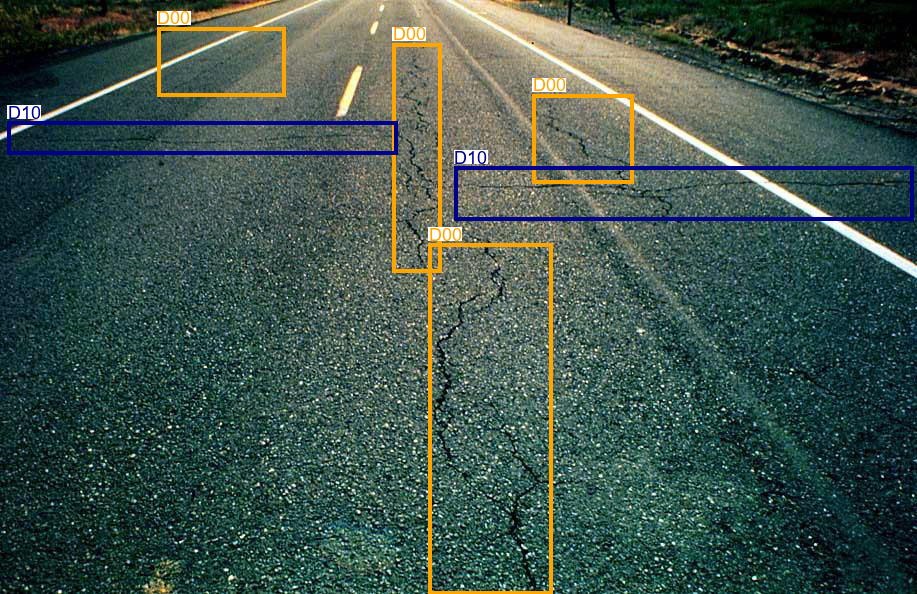

In [11]:
image

### D01:

Descripción: construction joint part  
Tipo: logitudinal linear crack  

In [12]:
# img India_009712.jpg
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d01Example.jpg")


0: 640x640 2 D01s, 416.0ms
Speed: 17.0ms preprocess, 416.0ms inference, 7.0ms postprocess per image at shape (1, 3, 640, 640)


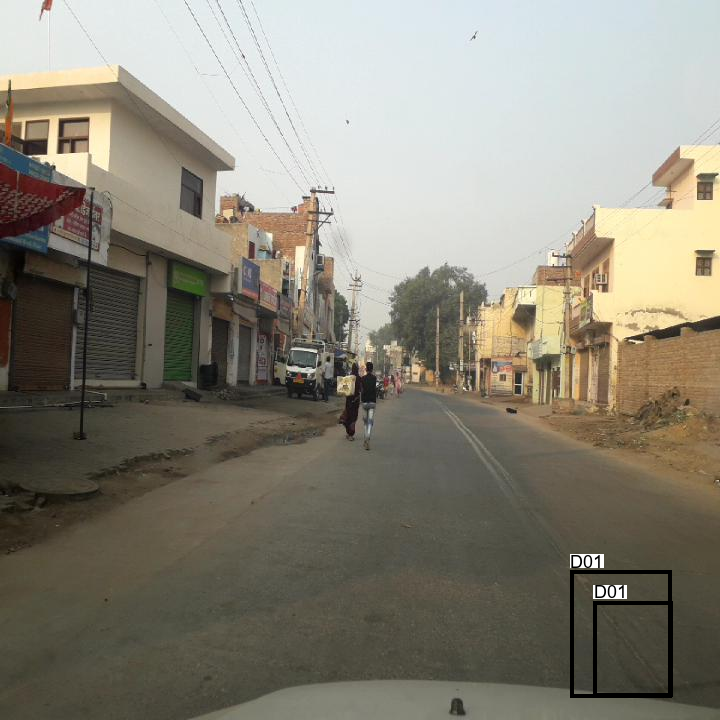

In [13]:
image

### D10:

Descripción: equal interval  
Tipo: lateral linear crack  

In [14]:
# img https://www.pavemanpro.com/article/identifying_asphalt_pavement_defects/
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d10Example.png")


0: 384x640 1 D10, 1 D00, 403.0ms
Speed: 9.0ms preprocess, 403.0ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


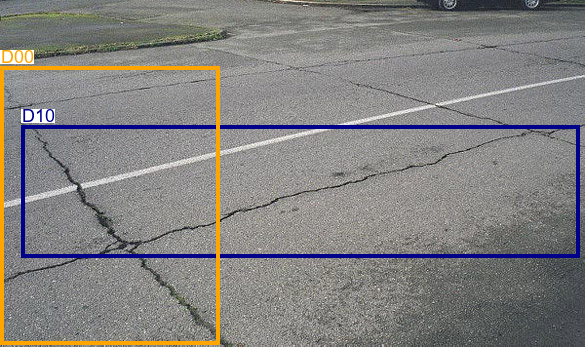

In [15]:
image

### D11:

Descripción: construction joint part  
Tipo: lateral linear crack  

In [16]:
# img: India_001755.jpg
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d11Example.jpg")

0: 640x640 1 D00, 2 D01s, 3 D11s, 318.0ms
Speed: 17.0ms preprocess, 318.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


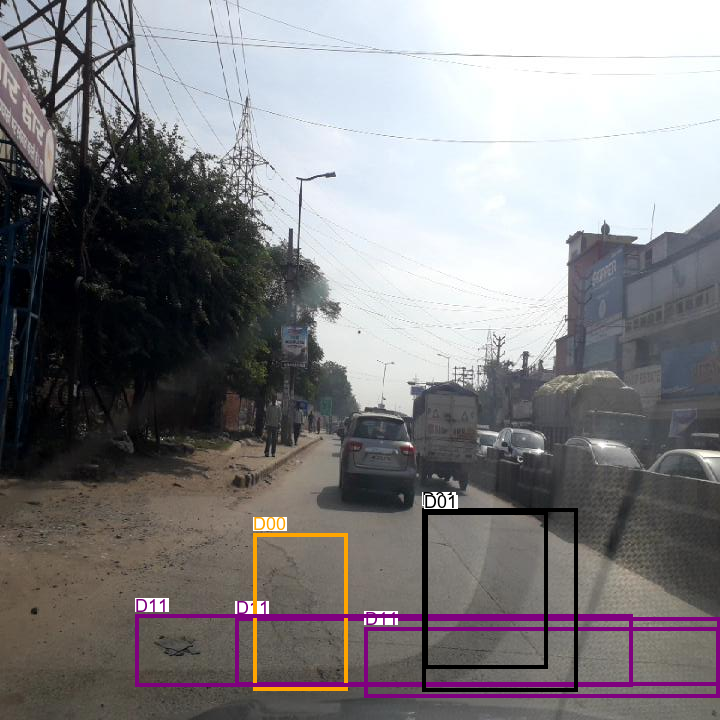

In [17]:
image

### D20:

Descripción: partial pavement  
Tipo: alligator crack  

In [52]:
# img: https://www.wolfpaving.com/hubfs/images/blog/2016_Blogs/WOLF_Social_alligator-2.jpg
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d20Example2.png")


0: 384x640 1 D20, 308.0ms
Speed: 8.0ms preprocess, 308.0ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)


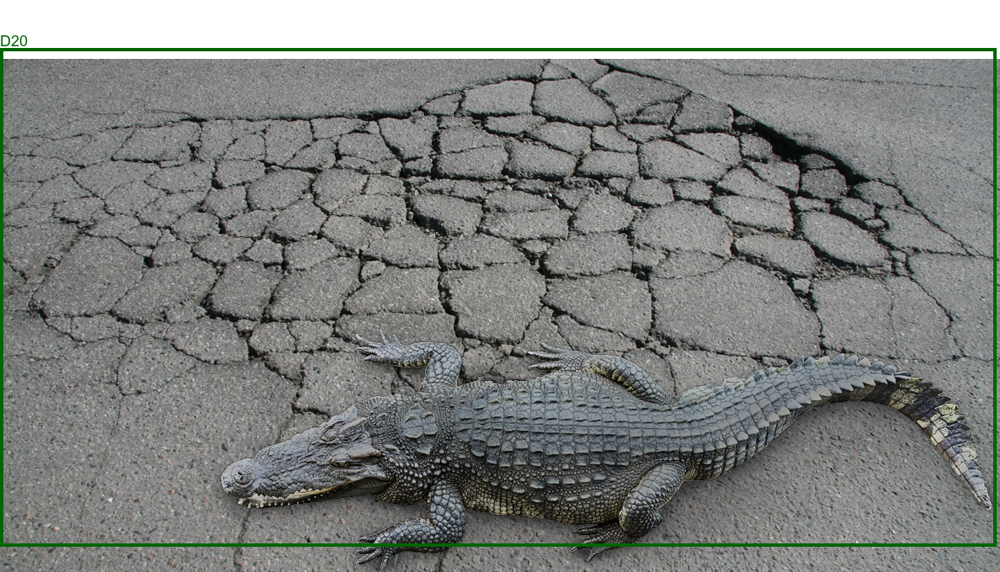

In [53]:
image

In [20]:
# img: https://www.roadbotics.com/2019/10/17/distress-call-alligator-cracking/

image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d20Example.png")


0: 448x640 1 D20, 376.0ms
Speed: 10.0ms preprocess, 376.0ms inference, 4.0ms postprocess per image at shape (1, 3, 448, 640)


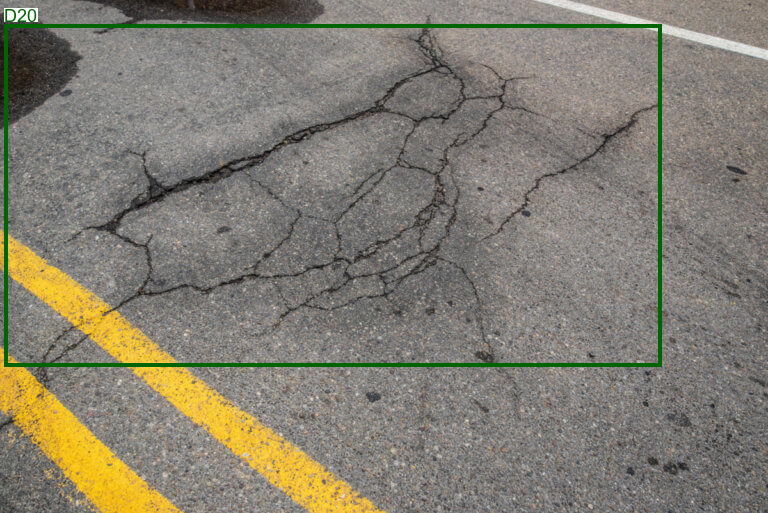

In [21]:
image


### D40:

Descripción: rutting  
Tipo: Bump - pothole or separation  



In [24]:
# img: https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.planforfreedom.com%2Fthe-guide-to-a-pothole-damage-claim-for-texas-drivers%2F&psig=AOvVaw11NreuZEBZW56mXl0YZlD3&ust=1725716238629000&source=images&cd=vfe&opi=89978449&ved=0CBQQjRxqFwoTCKi26Ze4rogDFQAAAAAdAAAAABAE

image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d40Example1.png")


0: 448x640 2 D40s, 306.0ms
Speed: 9.0ms preprocess, 306.0ms inference, 5.0ms postprocess per image at shape (1, 3, 448, 640)


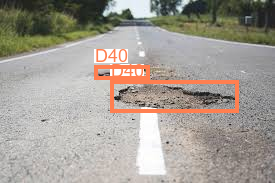

In [25]:
image

In [36]:
# https://www.motoringresearch.com/car-news/one-in-four-damaged-pothole-speed-bump/
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d40Example2.png")


0: 384x640 1 D40, 388.0ms
Speed: 8.0ms preprocess, 388.0ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)


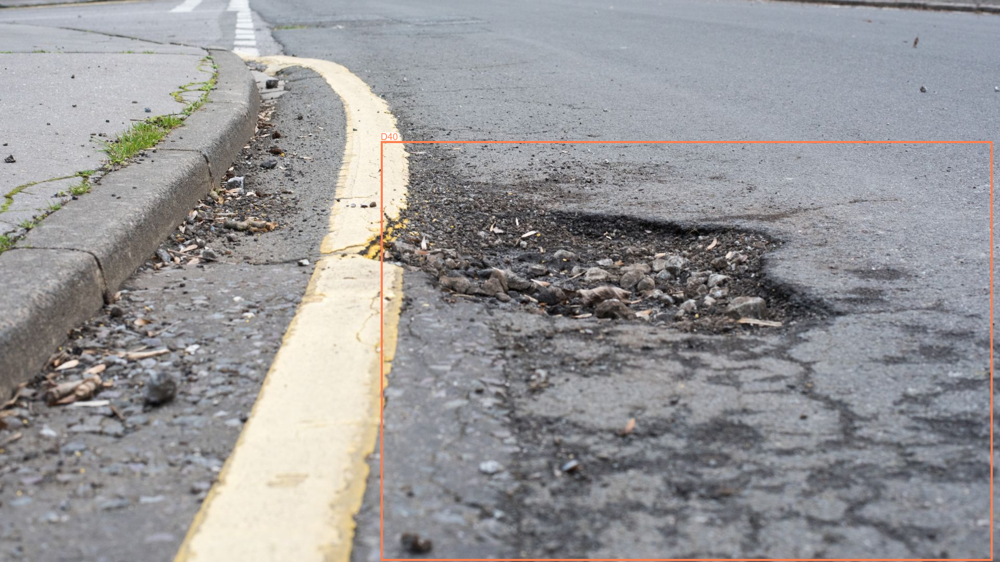

In [37]:
image

### D43:

Descripción: crosswalk blur  
Tipo: other corruption  

In [50]:
# img: Japan_013042
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d43Example.jpg")


0: 640x640 1 D43, 439.0ms
Speed: 17.0ms preprocess, 439.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


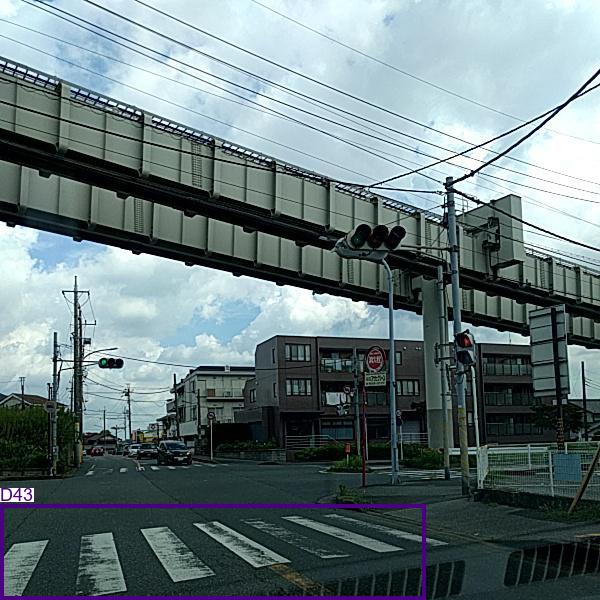

In [51]:
image

### D44:

Descripción: white line blur  
Tipo: other corruption  

In [56]:
# img: Japan_013121.jpg
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d44Example.jpg")


0: 640x640 1 D10, 1 D44, 1 D50, 356.0ms
Speed: 18.0ms preprocess, 356.0ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


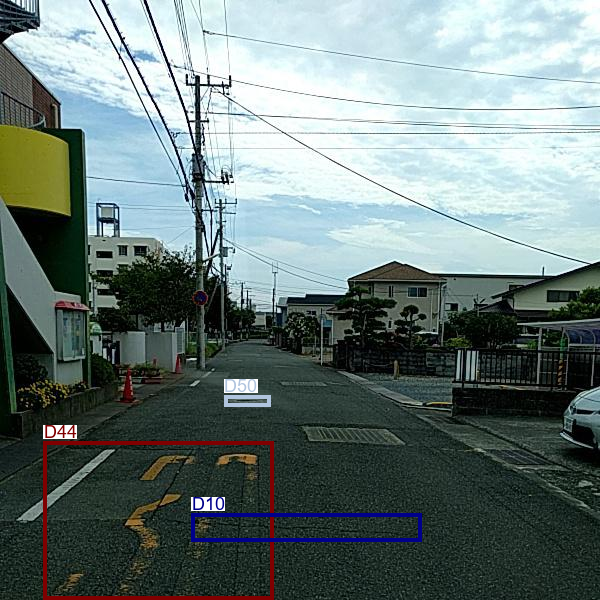

In [57]:
image

### Repair:

Descripción: white line blur  
Tipo: scar  

In [63]:
# img: Japan_013121.jpg
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/repairExample.jpg")


0: 640x640 2 Repairs, 387.0ms
Speed: 15.0ms preprocess, 387.0ms inference, 8.0ms postprocess per image at shape (1, 3, 640, 640)


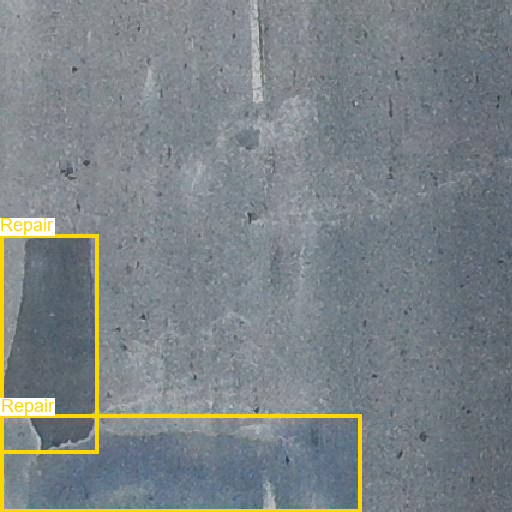

In [64]:
image

### D50:

Descripción: white line blur  
Tipo: Manhole cover  

In [104]:
# img: https://previews.123rf.com/images/mustafaoncul/mustafaoncul2102/mustafaoncul210200119/164614954-una-vieja-tapa-de-boca-de-alcantarilla-rodeada-por-una-calle-asfaltada.jpg
image, L_bboxes, L_danios = get_external_img_v8(modelv8st,"EvidFuncional/d50Example.png")


0: 448x640 3 D40s, 1 D50, 312.9ms
Speed: 10.1ms preprocess, 312.9ms inference, 5.0ms postprocess per image at shape (1, 3, 448, 640)


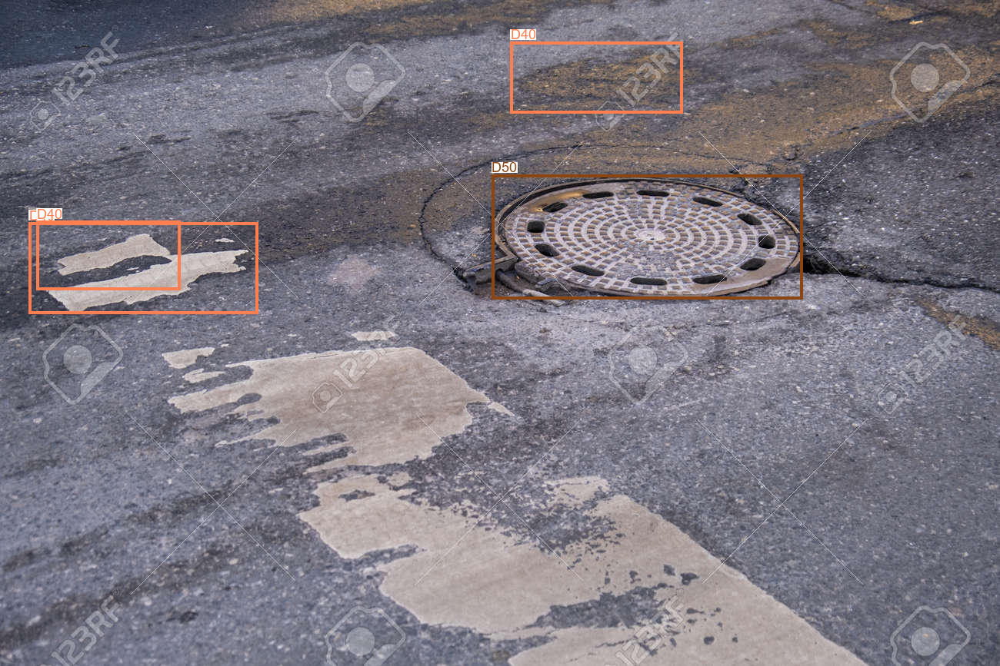

In [105]:
image